In [2]:
%reload_ext autoreload
%autoreload 2

import sys
sys.path.append(r'C:\Users\kmm171\ImageAnalysis\caImageAnalysis')
import main.main_eva as main_eva

import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from natsort import natsort_keygen, natsorted
import scipy
from scipy.stats import linregress
from tqdm import tqdm
import seaborn as sns
import numpy as np
import pandas as pd
import os
from utilities.pathutils import pathcrawler
from math import ceil
from utilities.create_ColorDict import hex_to_RGB as hex_to_RGB

In [81]:
fishpaths = {
    1: pathcrawler(r"C:\Users\kmm171\Desktop\Data\gut_tectum\20230914_7dpf\fish1\54_huch2bgcamp6s_7dpf_unfed_mono_L_20230914", set(), [], "img_stack_0"),
    2: pathcrawler(r"C:\Users\kmm171\Desktop\Data\gut_tectum\20230914_7dpf\fish1\54_huch2bgcamp6s_7dpf_unfed_mono_L_20230914", set(), [], "img_stack_1"),
    3: pathcrawler(r"C:\Users\kmm171\Desktop\Data\gut_tectum\20230914_7dpf\fish1\54_huch2bgcamp6s_7dpf_unfed_mono_L_20230914", set(), [], "img_stack_2"),
    #4: pathcrawler(r"C:\Users\kmm171\Desktop\Data\gut_tectum\20230820_7dpf\fish2", set(), [], "38h_1cmback"),
    #5: pathcrawler(r"C:\Users\kmm171\Desktop\Data\gut_tectum\20230820_7dpf\fish4\40_huch2bgcamp6s_7dpf_fed_mono_R_20230820", set(), [], "img_stack_0"),
    #6: pathcrawler(r"C:\Users\kmm171\Desktop\Data\gut_tectum\20230820_7dpf\fish4\40_huch2bgcamp6s_7dpf_fed_mono_R_20230820", set(), [], "img_stack_1"),
    #7: pathcrawler(r"C:\Users\kmm171\Desktop\Data\gut_tectum\20230820_7dpf\fish4\40_huch2bgcamp6s_7dpf_fed_mono_R_20230820", set(), [], "img_stack_2"),
    #8: pathcrawler(r"C:\Users\kmm171\Desktop\Data\gut_tectum\20230820_7dpf\fish4\40_huch2bgcamp6s_7dpf_fed_mono_R_20230820", set(), [], "img_stack_3")
}
fishpaths

{1: ['C:\\Users\\kmm171\\Desktop\\Data\\gut_tectum\\20230914_7dpf\\fish1\\54_huch2bgcamp6s_7dpf_unfed_mono_L_20230914\\img_stack_0'],
 2: ['C:\\Users\\kmm171\\Desktop\\Data\\gut_tectum\\20230914_7dpf\\fish1\\54_huch2bgcamp6s_7dpf_unfed_mono_L_20230914\\img_stack_1'],
 3: ['C:\\Users\\kmm171\\Desktop\\Data\\gut_tectum\\20230914_7dpf\\fish1\\54_huch2bgcamp6s_7dpf_unfed_mono_L_20230914\\img_stack_2']}

In [82]:
fishSchool = {}
for k in fishpaths.keys():
    for i, p in enumerate(fishpaths[k]):
        f = main_eva.Fish(p, stimkey="output")
        fishSchool[f'fish{k}_{i}'] = f
#no frametimes? revise each txt file in img_stacks for empty spaces

In [83]:
for key, stack in fishSchool.items():
    stack.parsePaths()
    basepath = stack.dataPaths['image'].parents[0].joinpath('suite2p')

    stack.dataPaths["suite2p"] = {
        "iscell": basepath.joinpath(
            "plane0/iscell.npy"
        ),
        "stats": basepath.joinpath(
            "plane0/stat.npy"
        ),
        "ops": basepath.joinpath(
            "plane0/ops.npy"
        ),
        "f_cells": basepath.joinpath(
            "plane0/F.npy"
        ),
        "f_neuropil": basepath.joinpath(
            "plane0/Fneu.npy"
        ),
        "spikes": basepath.joinpath(
            "plane0/spks.npy"
        ),
        "data": basepath.joinpath(
            "plane0/data.bin"
        ),
    }

In [85]:
offset = 40

responses_fishSchool = {}
errors_fishSchool = {}
bool_df_fishSchool = {}
responders_fishSchool = {}

ops_fishSchool = {}
iscell_fishSchool = {}
stats_fishSchool = {}
f_cells_fishSchool = {}

for key, stack in fishSchool.items():
    ops, iscell, stats, f_cells = stack.load_suite2p(stack.dataPaths['suite2p'])
    f_cells = stack.norm_fdff(f_cells)

    neuron_responses = {}
    neuron_stds = {}

    for stimulus in stack.stimulus_df_condensed.stim_name.unique():
        stimmy_df = stack.stimulus_df_condensed[
            stack.stimulus_df_condensed.stim_name == stimulus
            ]

        starts = stimmy_df['static_frame'].values

        allArrs = []
        for start_val in starts:
            stimArr = f_cells[:, start_val + 2 : start_val + 2 + offset]
            bgArr = f_cells[:, start_val - offset : start_val - 1]
            diffArr = np.nanmean(stimArr, axis=1) - np.nanmean(bgArr, axis=1)
            allArrs.append(diffArr)
        meanVals = np.nanmean(allArrs, axis=0)
        stdVals = np.nanstd(allArrs, axis=0)

        neuron_responses[stimulus] = meanVals
        neuron_stds[stimulus] = stdVals

    responses = pd.DataFrame(neuron_responses)
    errors = pd.DataFrame(neuron_stds)
    bool_df = responses >= errors
    responders = bool_df[bool_df.sum(axis=1) > 0]
    f_cells = pd.DataFrame(f_cells)

    responses_fishSchool[key] = responses
    errors_fishSchool[key] = errors
    bool_df_fishSchool[key] = bool_df
    responders_fishSchool[key] = responders

    ops_fishSchool[key] = ops
    iscell_fishSchool[key] = iscell
    stats_fishSchool[key] = stats
    f_cells_fishSchool[key] = f_cells

In [86]:
sample_fish = fishSchool['fish1_0']

PiBlueGreen_gradient = ['#DB21A7','#F200C9','#FF2DFF','#7DF9FF','#40E0D0','#A5D721','#82B300']
RGB_colors = [hex_to_RGB(color) for color in PiBlueGreen_gradient]
unitRGB_colors = []
for color in RGB_colors:
    unit_rgb = [e/255 for e in color]
    unitRGB_colors.append(unit_rgb)


unique_stims = natsorted([e for e in sample_fish.stimulus_df_condensed.stim_name.unique()])

colors_fishSchool = {}
colors_nrn_traces = {}
color_dict = {}
for i, n in enumerate(unique_stims): #range(1,max_stim_size+1):
    color_dict[n] = unitRGB_colors[i] #sns.color_palette(color_palette, n_colors=len(unique_stims))[i]
for k, v in color_dict.items():
    old_colors = list(v)
    fishSchool_alpha = [1]
    nrn_traces_alpha = [0.75]

    colors_fishSchool[k] = old_colors + fishSchool_alpha
    colors_nrn_traces[k] = old_colors + nrn_traces_alpha

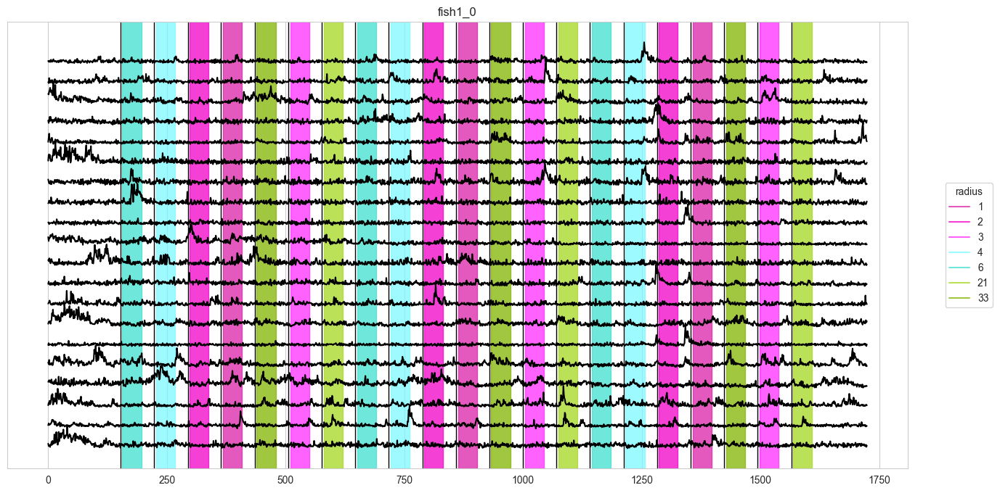

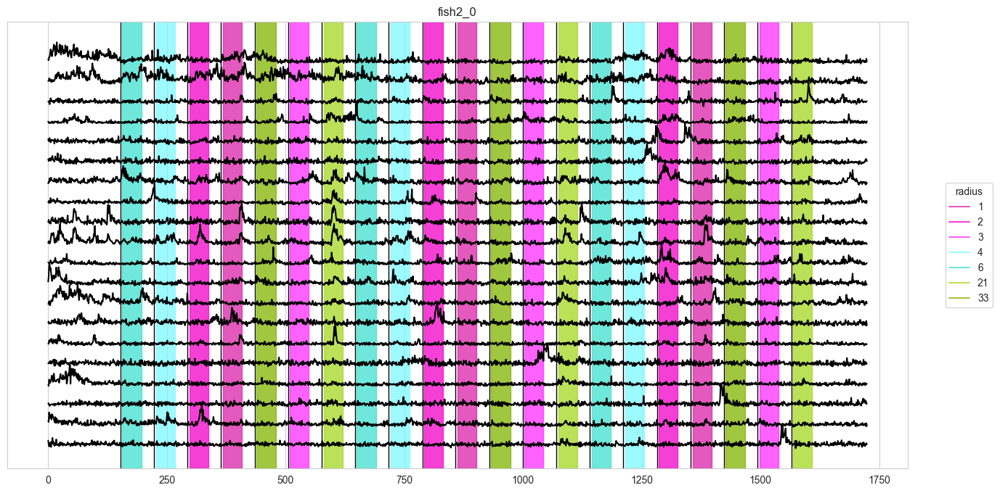

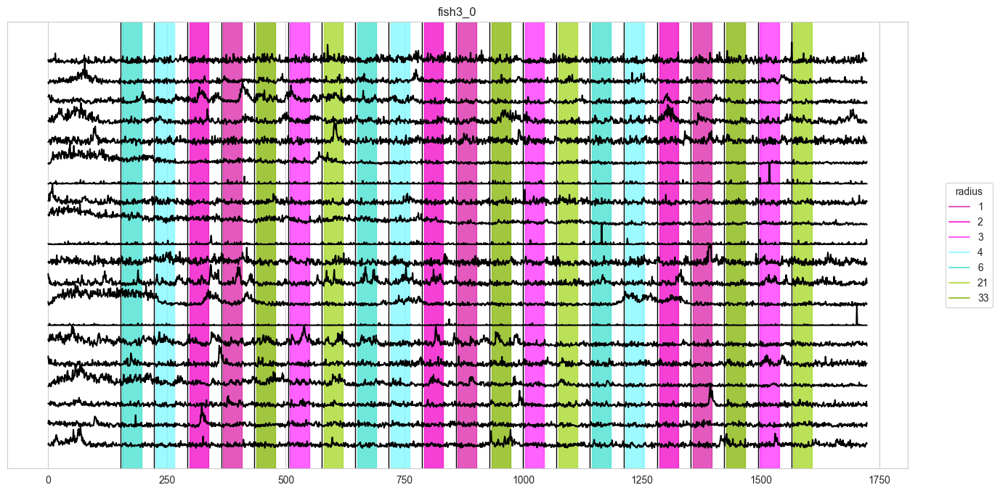

In [87]:
for key, stack in fishSchool.items():
    static_frames = stack.stimulus_df_condensed['static_frame']
    motion_frames = stack.stimulus_df_condensed['motion_frame']
    stimmies = stack.stimulus_df_condensed['stim_name']

    plt.figure(figsize=(16,8))
    for z in range(20,40): #responders.index.tolist()[0:20]: #
        plt.plot(np.arange(len(f_cells_fishSchool[key].iloc[z])), f_cells_fishSchool[key].iloc[z] + z, color="black")

    for frame, stimmy in zip(static_frames, stimmies):
        if stimmy in colors_fishSchool.keys():
            plt.axvspan(frame, frame, color='black') #+ 0.20

    for frame, stimmy in zip(motion_frames, stimmies):
        if stimmy in colors_nrn_traces.keys():
            plt.axvspan(frame , frame + 40 , color=colors_nrn_traces[stimmy]) #+ 0.20

    #plt.xlim(0, 325)

    legend_lines = [Line2D([0], [0], color=clr) for clr in colors_nrn_traces.values()]
    legend_labels = [str(label) for label in colors_nrn_traces.keys()]

    plt.title(f'{key}')
    plt.legend(legend_lines, legend_labels, title="radius", loc='center right', bbox_to_anchor=(1.1,0.5))
    plt.yticks([])
    plt.show()


In [88]:
cell_img_fishSchool = {}
for key, stack in fishSchool.items():
    cell_img = np.zeros((ops_fishSchool[key]["Ly"], ops_fishSchool[key]["Lx"], 4), 'float64') #start with a blank image

    for row in range(len(responders_fishSchool[key])):
        cell = responders_fishSchool[key].iloc[row]

        nrn_color = [0,0,0,0]

        for stim in colors_fishSchool.keys():
            if cell[stim]:
                nrn_color = [nrn_color[i] + colors_fishSchool[stim][i] for i in range(len(nrn_color))]
            else:
                pass

        nrn_color = np.clip(nrn_color, a_min=0, a_max=1)
        ypix = stats_fishSchool[key][cell.name]['ypix']
        xpix = stats_fishSchool[key][cell.name]['xpix']

        for n, c in enumerate(nrn_color):
            cell_img[ypix, xpix, n] = c

    cell_img_fishSchool[key] = cell_img

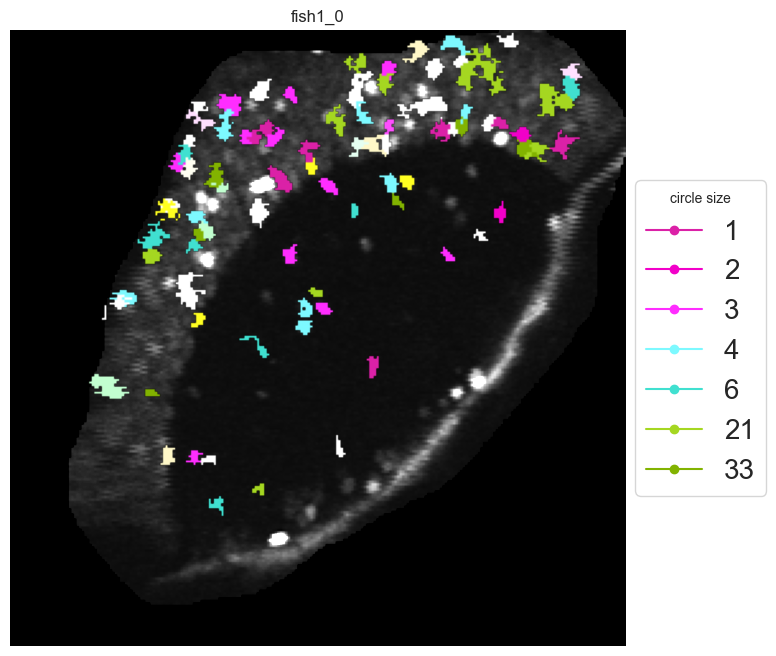

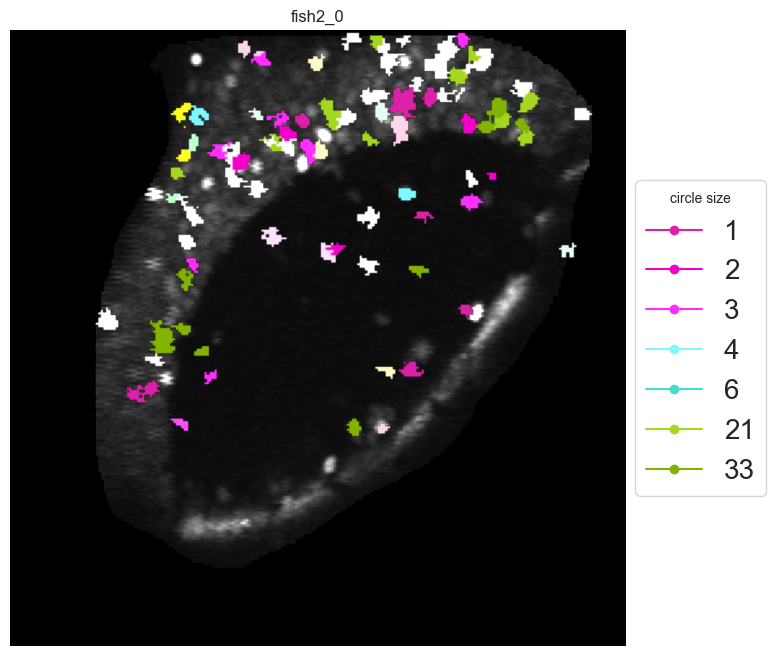

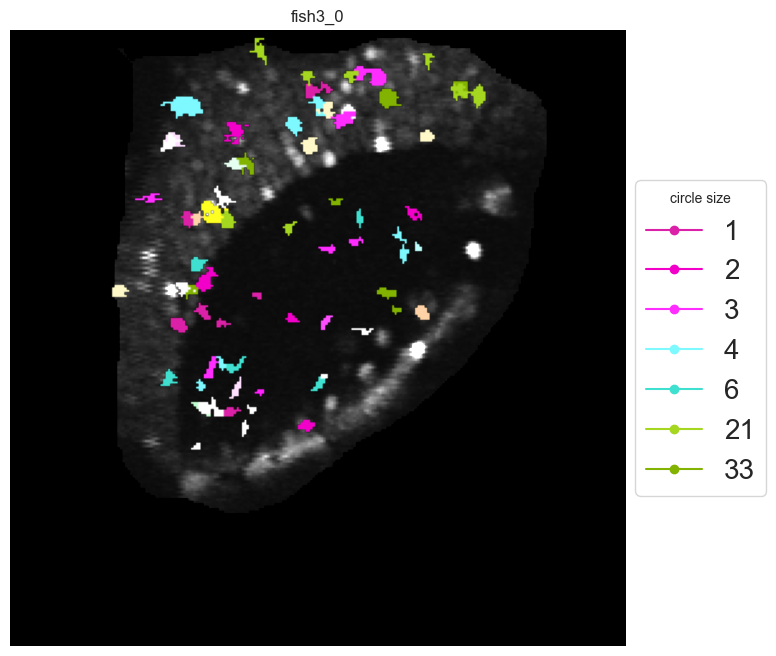

In [89]:
for key, stack in fishSchool.items():
    fig, ax = plt.subplots(1,1, figsize=(8,8))

    ax.imshow(ops_fishSchool[key]['refImg'], cmap='gray', vmin=25, vmax=800)
    ax.imshow(cell_img_fishSchool[key])

    ax.axis('off')

    legend_lines = [Line2D([], [], color=v, marker='o') for v in colors_fishSchool.values()]
    legend_labels = [str(label) for label in colors_fishSchool.keys()]

    plt.legend(legend_lines, legend_labels, loc='right', bbox_to_anchor=[1.25, 0.5], title='circle size', fontsize="20")
    plt.title(f'{key}')
    plt.show()

In [90]:
num_trials = 3

stacked_resp_fishSchool = {}
stacked_avg_fishSchool = {}
norm_stacked_avg_fishSchool = {}

for key, stack in fishSchool.items():
    start_stim = stack.stimulus_df_condensed['stim_name'][0:len(colors_fishSchool)].tolist()[0]
    end_stim = stack.stimulus_df_condensed['stim_name'][0:len(colors_fishSchool)].tolist()[-1]
    frame_start = stack.stimulus_df_condensed.query(f"stim_name=='{start_stim}'")['static_frame'].tolist()
    frame_end = stack.stimulus_df_condensed.query(f"stim_name=='{end_stim}'")['static_frame'].tolist() #for determining the range from the first stim to the last
    frame_ranges = pd.DataFrame(zip(frame_start, frame_end),columns=['start', 'end'])
    num_rows = len(f_cells_fishSchool[key]) * num_trials
    num_cols = frame_ranges['end'][0] + offset #frame_end[0] - frame_start[0] + 45
    stacked_resp = np.zeros((num_rows,num_cols))
    stacked_resp[:] = np.nan

    for neuron in range(len(f_cells_fishSchool[key])):
        for i, row in frame_ranges.iterrows():
            length_check = f_cells_fishSchool[key].iloc[neuron, frame_ranges['start'][i] - frame_ranges['start'][0]:frame_ranges['end'][i]+offset+2].shape[0]
            if length_check < num_cols: #verify that the length of the array is the same as the stacked_resp len
                diff_val = abs(np.subtract(num_cols,length_check))
                resp_block = f_cells_fishSchool[key].iloc[neuron, frame_ranges['start'][i] - frame_ranges['start'][0]:frame_ranges['end'][i] + offset+2 + diff_val].to_numpy(copy=True) #resp_block = this is one set of 242 neurons responding to each iteration of the stimulus (equal to 45 frames). Then, stack this by size.
            elif length_check > num_cols:
                diff_val = abs(np.subtract(num_cols,length_check))
                resp_block = f_cells_fishSchool[key].iloc[neuron, frame_ranges['start'][i] - frame_ranges['start'][0]:frame_ranges['end'][i] + offset+2 - diff_val].to_numpy(copy=True)
            else: #length_check == num_cols
                resp_block = f_cells_fishSchool[key].iloc[neuron, frame_ranges['start'][i] - frame_ranges['start'][0]:frame_ranges['end'][i] + offset+2].to_numpy(copy=True)

            stacked_resp = np.vstack([stacked_resp,resp_block])


    nan_indexList = [np.any(i) for i in np.isnan(stacked_resp)]
    stacked_resp = np.delete(stacked_resp, nan_indexList, axis=0)
    stacked_resp = pd.DataFrame(stacked_resp)
    print(f'{key}_resp shape: {stacked_resp.shape}')

    stacked_avg = stacked_resp.groupby(np.arange(len(stacked_resp))//num_trials).mean()
    #normalize each neuron to its own peak value
    peak_value = stacked_avg.max(axis=1)
    norm_stacked_avg = stacked_avg.divide(peak_value, axis=0)

    stacked_resp_fishSchool[key] = stacked_resp
    stacked_avg_fishSchool[key] = stacked_avg
    norm_stacked_avg_fishSchool[key] = norm_stacked_avg

fish1_0_resp shape: (408, 616)
fish2_0_resp shape: (435, 616)
fish3_0_resp shape: (342, 616)


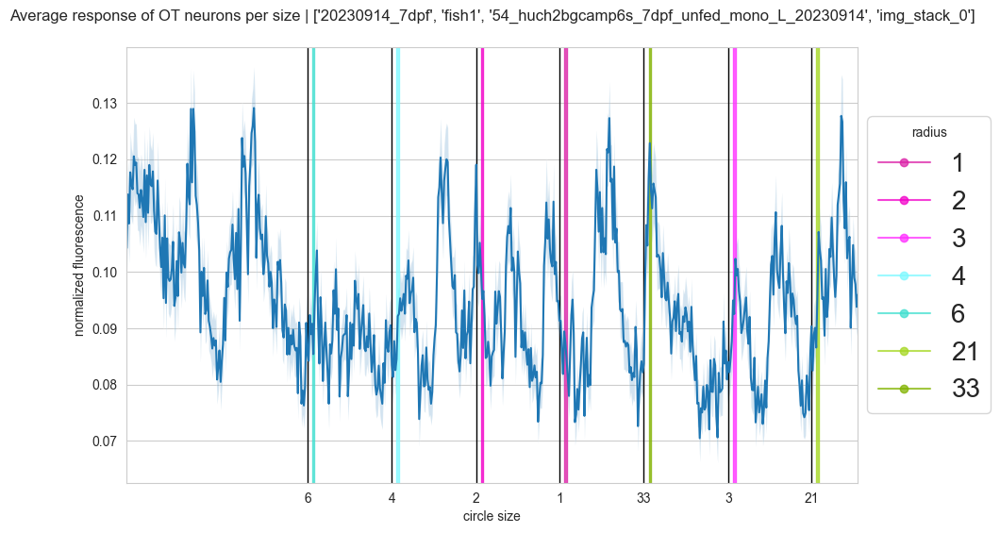

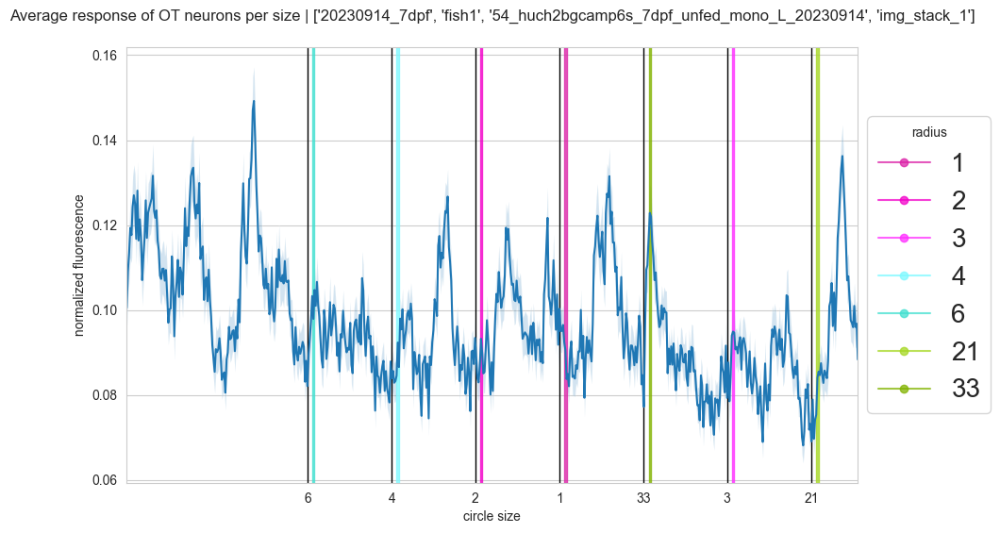

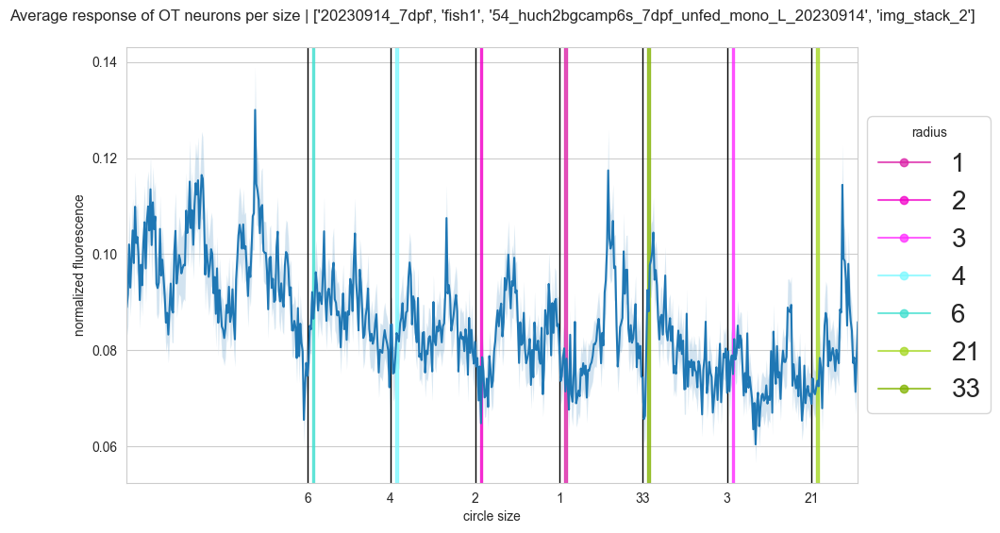

In [91]:
dataset_names = []

for index, fish in fishpaths.items():
    for stack in fish:
        dataset_names.append(stack.split('\\')[-4:])

counter = 0
for key, stack in fishSchool.items():

    #SEM is standard deviation and dividing it by the square root of the sample size.
    #As size of sample data grows larger, the SEM decreases vs the SD. That is because as the sample size increases the sample mean estimate reflects the true mean of the population, so greater precision.
    #INcreasing the sample size doesn't necessarily make the SD larger or smaller; it just becomes a more accurate estimate of the population standard deviation.
    static_frames = stack.stimulus_df_condensed['static_frame'][0:len(colors_fishSchool)].tolist()
    motion_frames = stack.stimulus_df_condensed['motion_frame'][0:len(colors_fishSchool)].tolist()
    stim_names = stack.stimulus_df_condensed.stim_name[0:len(colors_fishSchool)].to_list()

    fig, ax = plt.subplots(figsize=(10,6))
    data = stacked_resp_fishSchool[key]
    def tsplot(ax, data,**kw):
        x = np.arange(data.shape[1])
        est = np.mean(data, axis=0)
        sd = np.std(data, axis=0)
        SEM = scipy.stats.sem(data,axis=0)
        cis = (est - SEM, est + SEM)
        ax.fill_between(x,cis[0],cis[1],alpha=0.2, **kw)
        ax.plot(x,est,**kw)
        ax.margins(x=0)

    tsplot(ax, data)
    #plt.ylim(0.08,0.16)
    plt.xlabel("circle size")
    plt.ylabel("normalized fluorescence")
    dataset_name = dataset_names[counter]
    plt.title(f"Average response of OT neurons per size | {dataset_name}", pad=20)
    plt.xticks(ticks=static_frames, labels=stim_names)

    for frame, stimmy in zip(static_frames, stim_names):
        if stimmy in colors_nrn_traces.keys():
            plt.axvspan(frame, frame , color='black')

    for frame, stimmy in zip(motion_frames, stim_names):
        if stimmy in colors_nrn_traces.keys():
            plt.axvspan(frame, frame+2, color=colors_nrn_traces[stimmy])

    legend_lines = [Line2D([], [], color=clr, marker='o') for clr in colors_nrn_traces.values()]
    legend_labels = [str(label) for label in colors_nrn_traces.keys()]

    plt.legend(legend_lines, legend_labels, title="radius", loc='center right', bbox_to_anchor=(1.2,0.5), fontsize="20")
    counter += 1

    plt.show()

In [95]:
fishSchool


{'fish1_0': <main.main_eva.Fish at 0x18c01f48f70>,
 'fish2_0': <main.main_eva.Fish at 0x18c98b624c0>,
 'fish3_0': <main.main_eva.Fish at 0x18cb719afd0>}

C:\soft\anaconda3\envs\caiman\lib\site-packages\numpy\core\fromnumeric.py:3430: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)
C:\soft\anaconda3\envs\caiman\lib\site-packages\numpy\core\fromnumeric.py:3430: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)
C:\soft\anaconda3\envs\caiman\lib\site-packages\numpy\core\fromnumeric.py:3430: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)
C:\soft\anaconda

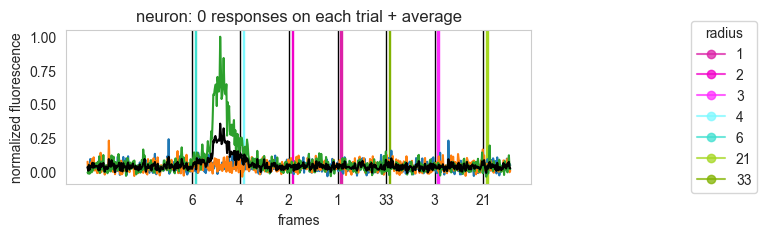

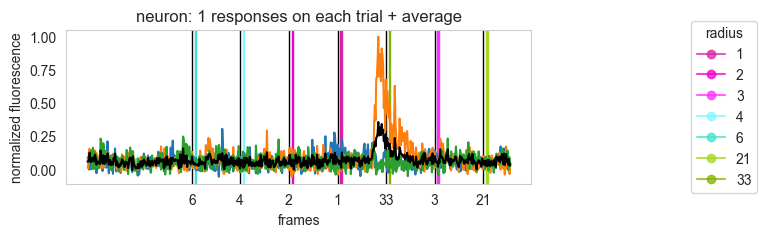

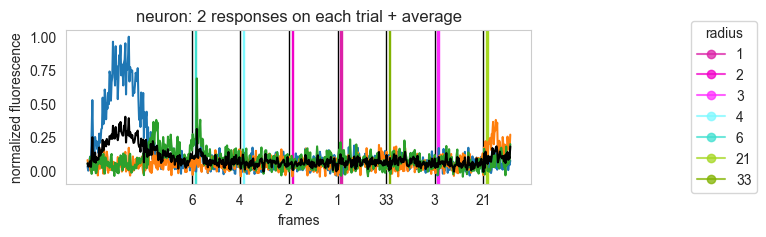

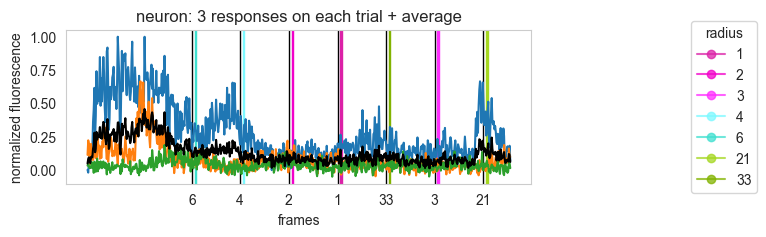

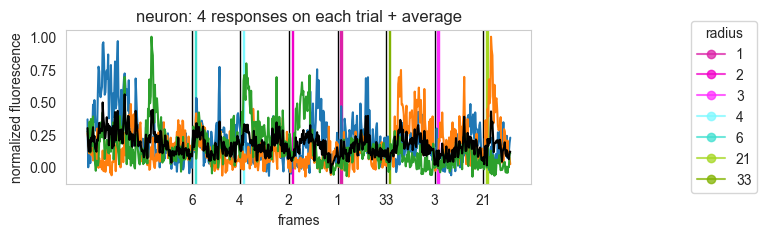

...

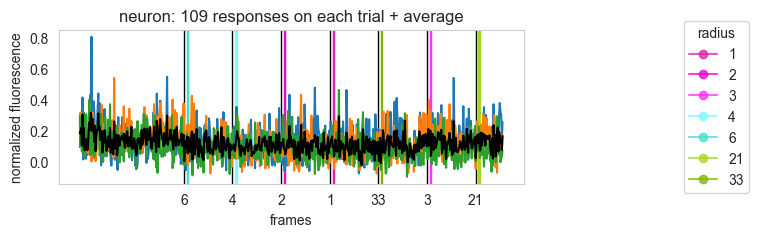

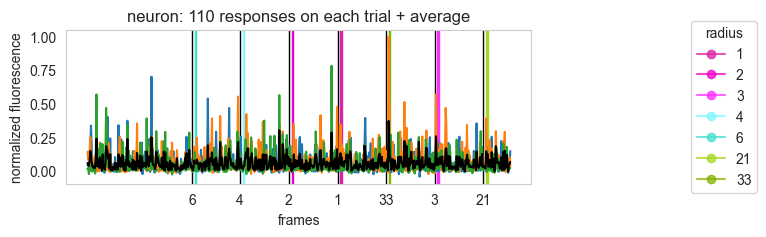

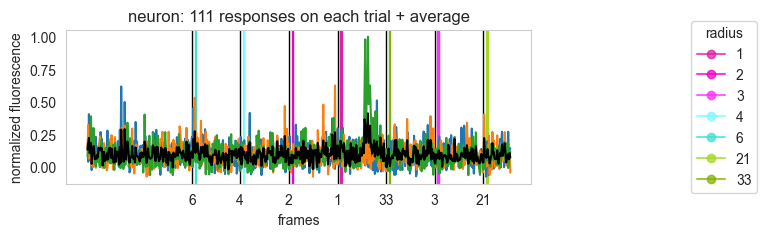

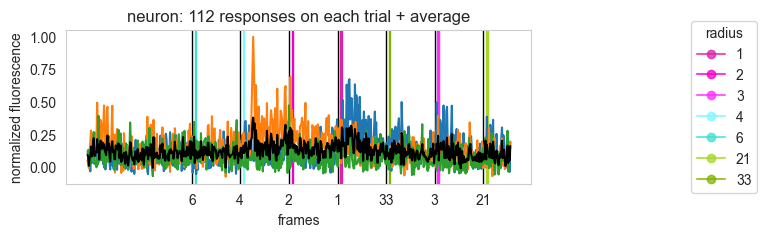

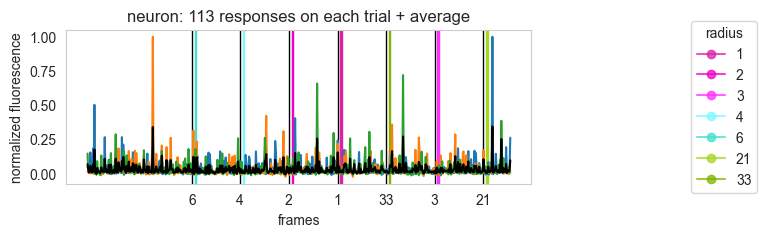

In [97]:
fish_num = 3
stack_num = 0
fishKey = f'fish{fish_num}_{stack_num}'

stacks_range = pd.DataFrame((zip(np.arange(0, len(stacked_resp_fishSchool[fishKey]), num_trials), np.arange(num_trials, len(stacked_resp_fishSchool[fishKey])+ num_trials, num_trials))), columns=['first','last'])
stim_names = fishSchool[fishKey].stimulus_df_condensed.stim_name[0:len(colors_fishSchool)].to_list()
static_frames = fishSchool[fishKey].stimulus_df_condensed['static_frame']
motion_frames = fishSchool[fishKey].stimulus_df_condensed['motion_frame']

graphs_path = fishpaths[fish_num][stack_num] + "\\" + "graphs" + "\\" + "resp_per_trial"
if not os.path.exists(graphs_path):
    os.makedirs(graphs_path)

for neuron, trial in stacks_range.iterrows():
    plt.figure(figsize=(6,2))
    plt.title(f'neuron: {neuron} responses on each trial + average')
    plt.xlabel('frames')
    plt.ylabel('normalized fluorescence')
    plt.xticks(ticks=static_frames[0:len(colors_fishSchool)].tolist(), labels=stim_names)
    #plt.ylim(-0.2,1.2)
    plt.grid(False)

    data = stacked_resp_fishSchool[fishKey].iloc[trial['first']:trial['last']]
    for trace in range(len(data)):
        plt.plot(data.iloc[trace])
    plt.plot(np.mean(data),color='black')
    legend_lines = [Line2D([], [], color=clr, marker='o') for clr in colors_nrn_traces.values()]
    legend_labels = [str(label) for label in colors_nrn_traces.keys()]

    plt.legend(legend_lines, legend_labels, title="radius", loc='center right', bbox_to_anchor=(1.5,0.5), fontsize="10")

    for frame, stimmy in zip(static_frames[0:len(colors_fishSchool)].tolist(), stim_names):
        if stimmy in colors_fishSchool.keys():
            plt.axvspan(frame, frame , color='black')

    for Mframe, Mstimmy in zip(motion_frames[0:len(colors_fishSchool)].tolist(), stim_names):
        if Mstimmy in colors_fishSchool.keys():
            plt.axvspan(Mframe, Mframe+2, color=colors_fishSchool[Mstimmy])


    plt.savefig(graphs_path + '\\' + f'neuron{neuron}.pdf')

In [ ]:
beforeandafterpeakFrames = 1

df_OutlierFiltered_stacked_resp_fishSchool = {}

for key, stack in fishSchool.items():

    stacks_range = pd.DataFrame((zip(np.arange(0,len(stacked_resp_fishSchool[key]),num_trials), np.arange(num_trials,len(stacked_resp_fishSchool[key])+num_trials,num_trials))), columns=['first_trial','last_trial'])
    stim_names = stack.stimulus_df_condensed.stim_name[0:len(colors_fishSchool)].to_list()
    baseline_length = 4 #how many frames before the start of the stimulus to average for the baseline activity

    num_stims = len(colors_fishSchool)
    static_frames_head = list(stack.stimulus_df_condensed['static_frame'][0:num_stims])
    motion_frames_head = list(stack.stimulus_df_condensed['motion_frame'][0:num_stims])
    both_frames = pd.DataFrame(zip(static_frames_head, motion_frames_head), columns=['static_frame', 'motion_frame'])

    list_OutlierFiltered_stacked_resp = {}

    for neuron, (first_trial, last_trial) in tqdm(stacks_range.iterrows(), total=stacks_range.shape[0]):

        list_chunk_positive_resp = []
        for index, (sframe,mframe) in both_frames.iterrows():
            #finding outliers
            test_trial_chunks_no_outlier = pd.DataFrame()

            trial_chunk = stacked_resp_fishSchool[key].iloc[first_trial:last_trial,mframe:mframe + offset] #defines where to find the peak
            peak_info = trial_chunk.max(axis=1) #this part gives me the max of each single trial
            peak_mean = peak_info.mean()
            peak_std = peak_info.std()

            for idx, peak in peak_info.items():
                if not peak > peak_mean + 1.1 * peak_std:
                    test_trial_chunks_no_outlier[idx] = trial_chunk.loc[idx] #print('no outliers here', i)

            #I don't want to take the mean of traces that although not an outlier, they maybe flat. let's take the r_values and compare
            r_values_NonOutlierTrial = []
            for i, NonOutlierTrial in test_trial_chunks_no_outlier.items():
                peak_idx = NonOutlierTrial.loc[mframe:].idxmax()
                y = NonOutlierTrial.loc[:peak_idx + 1]
                #y = np.asarray(NonOutlierTrial)
                slope, intercept, r_value, p_value, std_err = linregress(x=np.arange(len(y)), y=y)
                if r_value >= 0.10 and slope >= 0.002 and p_value < 0.06: #I determined these values bytes hand by looking at the data.
                    r_values_NonOutlierTrial.append(1)
                else:
                    r_values_NonOutlierTrial.append(0)

            if sum(r_values_NonOutlierTrial) > 1:

                #Take the r_value from each trial in test_trial_chunks_no_outlier.
                test_trial_chunks_no_outlier = test_trial_chunks_no_outlier.mean(axis=1)
                peak_index = test_trial_chunks_no_outlier.loc[mframe:].idxmax() #frame index
                peak_response_avg = test_trial_chunks_no_outlier.loc[peak_index-beforeandafterpeakFrames:peak_index+beforeandafterpeakFrames].mean()
                baseline_avg = test_trial_chunks_no_outlier.loc[:mframe].mean()
                baseline_std = test_trial_chunks_no_outlier.loc[:mframe].std()

                if peak_response_avg > 1.8*baseline_std + baseline_avg:
                    list_chunk_positive_resp.append(1)
                elif peak_response_avg < 1.8*baseline_std + baseline_avg:
                    list_chunk_positive_resp.append(0)
                else:
                    list_chunk_positive_resp.append(0)
            else:
                list_chunk_positive_resp.append(0)

        list_OutlierFiltered_stacked_resp[neuron] = list_chunk_positive_resp

    df_OutlierFiltered_stacked_resp = pd.DataFrame.from_dict(list_OutlierFiltered_stacked_resp).T
    df_OutlierFiltered_stacked_resp.columns = stim_names

    df_OutlierFiltered_stacked_resp_fishSchool[key] = df_OutlierFiltered_stacked_resp #its a True-False table that shows whether the response of each neuron to each stimulus is real. Compare this data to the traces you get for each neuron.


In [161]:
df_OutlierFiltered_stacked_resp_fishSchool['fish2_0']

,1,3,33,21,4,6,2
0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...
437,0,0,0,0,0,0,0
438,0,0,0,0,0,0,0
439,0,0,0,0,0,0,0
440,0,0,0,0,0,0,0


In [138]:
accepted_neurons_binaryClass_fishSchool = {}
responsive_neurons_fishSchool = {}
nonresponsive_neurons_fishSchool = {}
stim_names_int_fishSchool = {}

for key, stack in fishSchool.items():
    #Convert each trial chunk into a binary classification where 0 means no response and 1 is responsive (significantly)
    stim_names = stack.stimulus_df_condensed.stim_name[0:len(colors_fishSchool)].to_list()
    accepted_neurons_binaryClass = pd.DataFrame()
    discarded_neurons_binaryClass = pd.DataFrame()
    for idx, row in df_OutlierFiltered_stacked_resp_fishSchool[key].iterrows():
        if row.sum() != 0:
            accepted_neurons_binaryClass = pd.concat([accepted_neurons_binaryClass, row], axis=1)
        else:
            discarded_neurons_binaryClass = pd.concat([discarded_neurons_binaryClass, row], axis=1)
    accepted_neurons_binaryClass = accepted_neurons_binaryClass.T
    discarded_neurons_binaryClass = discarded_neurons_binaryClass.T

    #Use the accepted_neurons_binaryClass to get the activity traces from the chosen "accepted neurons" list
    responsive_neurons = pd.DataFrame()
    nonresponsive_neurons = pd.DataFrame()
    accepted_neurons_indexes = list(accepted_neurons_binaryClass.index)
    for idx, row in norm_stacked_avg_fishSchool[key].iterrows():
        if idx in accepted_neurons_indexes:
            responsive_neurons = pd.concat([responsive_neurons, row], axis=1)
        else:
            nonresponsive_neurons = pd.concat([nonresponsive_neurons, row], axis=1)
    responsive_neurons = responsive_neurons.T
    nonresponsive_neurons = nonresponsive_neurons.T

    #re-order the dataframe to reflect sizes in ascending order
    stim_names_int = natsorted(list(map(int,stim_names)))
    ordered_stim_names = list(map(str, stim_names_int))
    accepted_neurons_binaryClass= accepted_neurons_binaryClass[ordered_stim_names]

    accepted_neurons_binaryClass_fishSchool[key] = accepted_neurons_binaryClass
    responsive_neurons_fishSchool[key] = responsive_neurons
    nonresponsive_neurons_fishSchool[key] = nonresponsive_neurons
    stim_names_int_fishSchool[key] = stim_names_int


In [139]:
sorted_index = {}
sorted_stim_names = {}
for key, stack in fishSchool.items():
    mini_stim = stack.stimulus_df_condensed.stim_name[range(len(color_dict))]
    mini_stim = mini_stim.sort_values(key=natsort_keygen())
    sorted_index[key] = list(mini_stim.index)
    sorted_stim_names[key] = list(mini_stim)

peakResp_all_fishSchool = {}

#Right now is set for only two fish
for (key, stack) in fishSchool.items():
    static_frames_sort = sorted_index[key]
    stim_name_sort = sorted_stim_names[key]

    peakResp_all = []

    for i in range(len(responsive_neurons_fishSchool[key])):
        avg_peakResps_per_nrn = []
        for size, frame in zip(stim_name_sort,static_frames_sort):
            if accepted_neurons_binaryClass_fishSchool[key].iloc[i][size] == 1:
                peak_index = responsive_neurons_fishSchool[key].iloc[i,frame:frame+7].idxmax()
                peak_avg = responsive_neurons_fishSchool[key].iloc[i,peak_index-5:peak_index+5].mean()
                avg_peakResps_per_nrn.append(peak_avg)

            else:
                avg_peakResps_per_nrn.append(0)

        peakResp_all.append(avg_peakResps_per_nrn)

    peakResp_all = pd.DataFrame(peakResp_all, columns=stim_name_sort)
    highest_value = peakResp_all.max(axis=1)
    peakResp_all = peakResp_all.divide(highest_value, axis=0)

    peakResp_all_fishSchool[key] = peakResp_all

In [140]:
WMR_unfed_fishSchool = {}
WMR_fed_fishSchool = {}

for (key, stack) in fishSchool.items():
    #Calculate weighted mean response angle
    if "fish4" in key or "fish3" in key:
        WMR = []
        for idx, row in peakResp_all_fishSchool[key].iterrows():
            weights = []
            for value in row:
                single_weight = value / sum(row)
                weights.append(single_weight)

            temp_wmr = []
            counter = 0
            for w in weights:
                to_sum = w * stim_names_int_fishSchool[key][counter]
                temp_wmr.append(to_sum)
                counter += 1

            WMR.append(sum(temp_wmr))

        WMR_fed_fishSchool[key] = WMR

    else:
        WMR = []
        for idx, row in peakResp_all_fishSchool[key].iterrows():
            weights = []
            for value in row:
                single_weight = value / sum(row)
                weights.append(single_weight)

            temp_wmr = []
            counter = 0
            for w in weights:
                to_sum = w * stim_names_int_fishSchool[key][counter]
                temp_wmr.append(to_sum)
                counter += 1

            WMR.append(sum(temp_wmr))

        WMR_unfed_fishSchool[key] = WMR

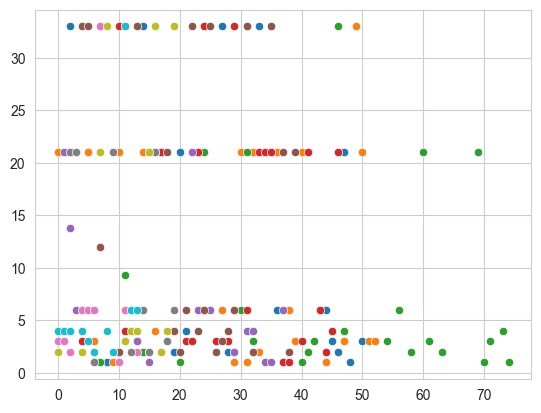

In [141]:
WMR_unfed_fishSchool
for k,e in WMR_unfed_fishSchool.items():
    sns.scatterplot(e)

In [ ]:
for (key, stack) in fishSchool.items():
    #plot data
    p_rows = len(responsive_neurons_fishSchool[key])
    p_cols = len(stim_names_int_fishSchool[key])
    fig_rows_num = ceil(p_rows/4)
    fig_cols_num = 4

    fig, axs = plt.subplots(nrows=fig_rows_num, ncols=fig_cols_num,layout='constrained',figsize=(3.5 * 4, 3.5 * fig_rows_num))

    x_vals = [int(e) for e in stim_names_int_fishSchool[key]]

    nrn = 0
    for (index, row), ax in zip(peakResp_all_fishSchool[key].iterrows(), axs.flat):
        #ax.axis('equal')
        ax.set_ylim([0,1])
        ax.set_title(f'neuron {index}')
        ax.set_ylabel('normalized df/f')
        ax.set_xlabel('circle diameter (degrees)')
        ax.set_xlim(0,max([int(i) for i in stim_names_int_fishSchool[key]]) + 1)
        ax.set_xticks(stim_names_int_fishSchool[key])
        ax.annotate(f"WMR = {WMR_fishSchool[key][nrn]:.1f}",xy=(WMR_fishSchool[key][nrn],0.5), xytext=(WMR_fishSchool[key][nrn]+1,0.8),arrowprops=dict(facecolor='red', shrink=0.05))
        ax.grid(False)
        ax.bar(x_vals, row.values)
        ax.axvline(x=WMR_fishSchool[key][nrn], color='red')

        nrn+=1
    fig.savefig(r'C:\Users\kmm171\Desktop\Data\gut_tectum\20230821_8dpf\analyzed\43_45')

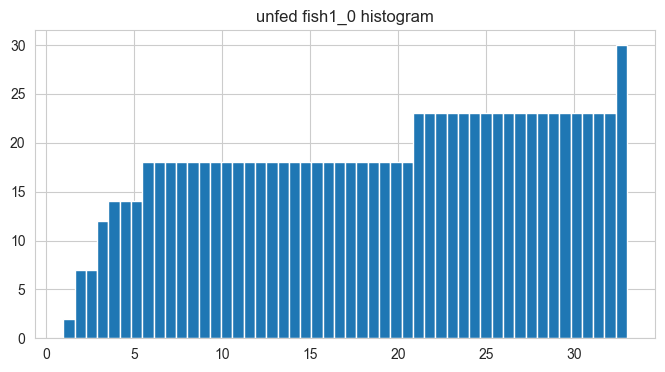

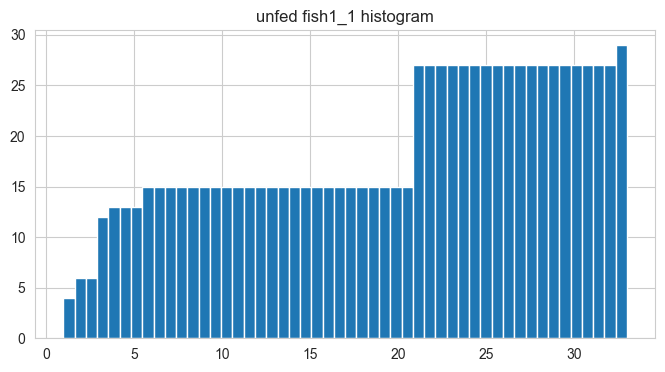

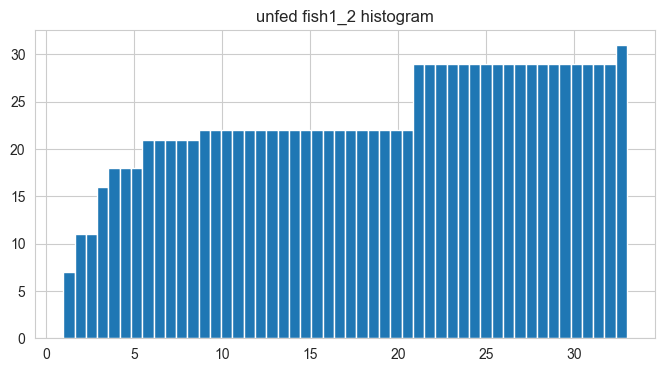

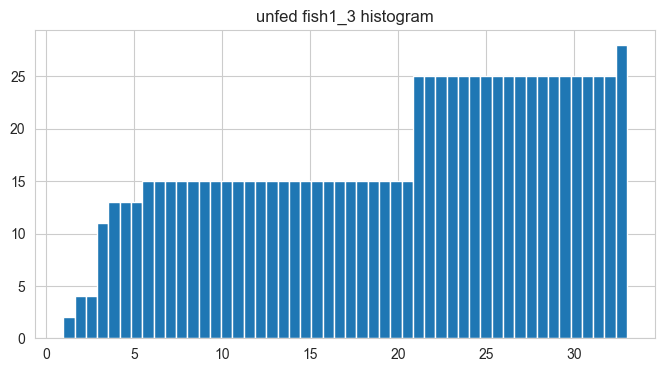

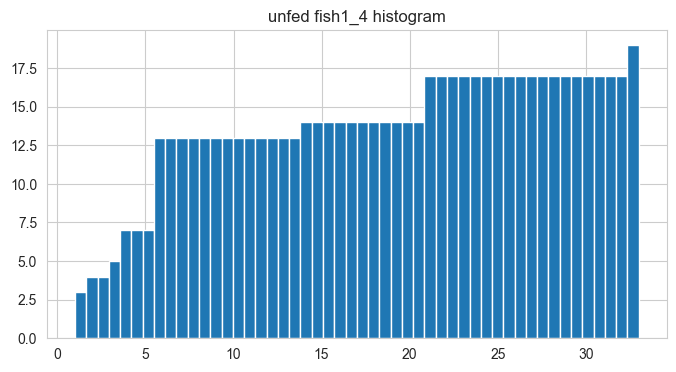

...

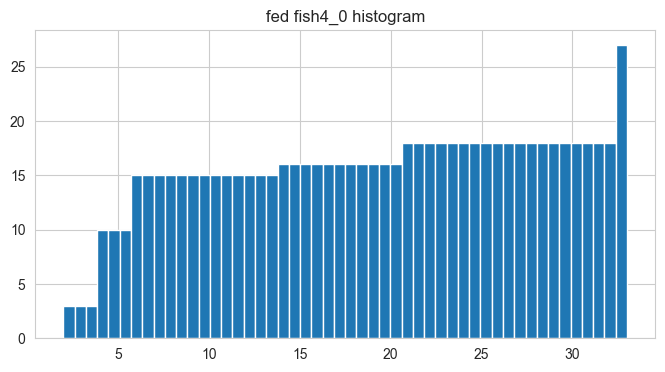

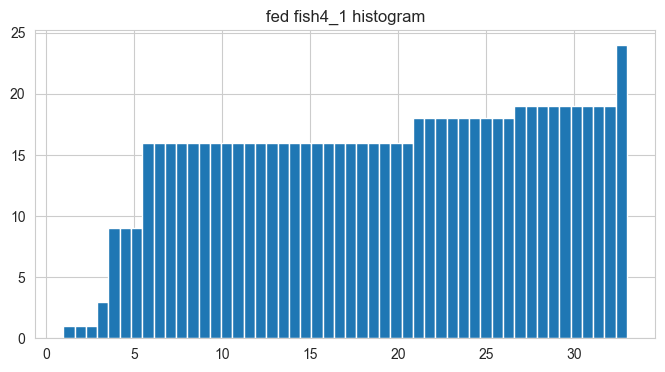

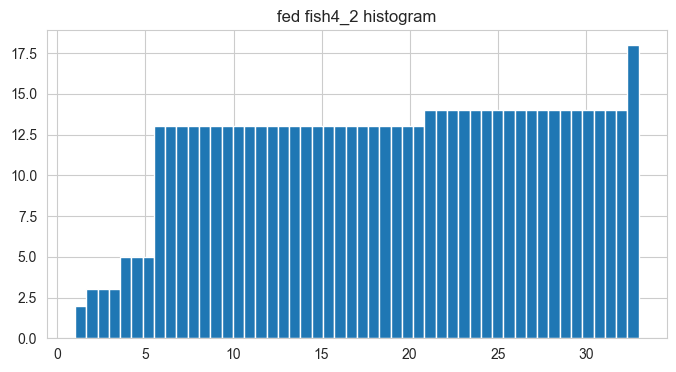

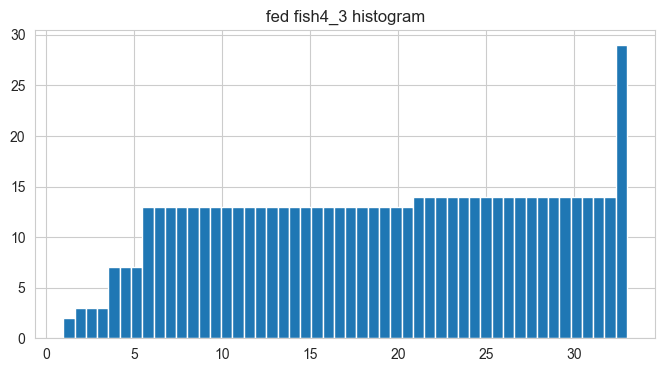

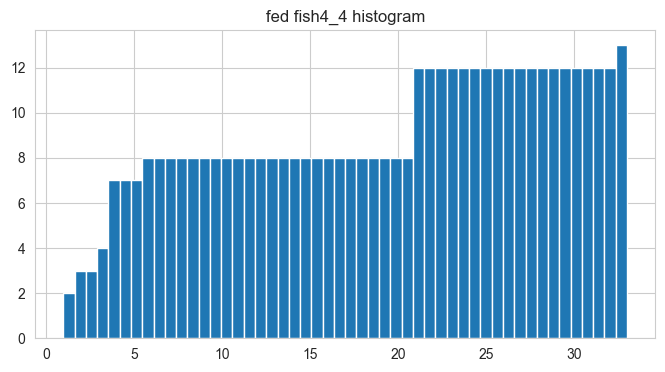

In [19]:
counts_fishSchool = {}

unfed_counts = {}
unfed_bins = {}
unfed_patches = {}

for key, WMR_list in WMR_unfed_fishSchool.items():
    fig, ax = plt.subplots(figsize=(8, 4))
    bins = np.arange(0,9,1)
    n_bins = 50
    # plot the cumulative histogram
    counts, bins, patches = ax.hist(WMR_list, n_bins,
                                    cumulative=True)
    ax.set_title(f"unfed {key} histogram")

    unfed_counts[key] = counts
    unfed_bins[key] = bins
    unfed_patches[key] = patches
    counts_fishSchool[key] = counts

fed_counts = {}
fed_bins = {}
fed_patches = {}

for key, WMR_list in WMR_fed_fishSchool.items():
    fig, ax = plt.subplots(figsize=(8, 4))
    bins = np.arange(0,9,1)
    n_bins = 50
    # plot the cumulative histogram
    counts, bins, patches = ax.hist(WMR_list, n_bins,
                                    cumulative=True)
    ax.set_title(f"fed {key} histogram")

    fed_counts[key] = counts
    fed_bins[key] = bins
    fed_patches[key] = patches
    counts_fishSchool[key] = counts

In [20]:
cum_sum_0 = pd.DataFrame()
cum_sum_1 = pd.DataFrame()
cum_sum_2 = pd.DataFrame()
cum_sum_3 = pd.DataFrame()
cum_sum_4 = pd.DataFrame()

for key, counts in counts_fishSchool.items():
    cum_sum = ((counts.cumsum() / counts.sum())*100)
    #fig, ax = plt.subplots(figsize=(8, 4))
    if int(key[-1]) == 0: #if the key fish1_0 as 0 as its last value, append it to cum_sum_0 and so on
        cum_sum_0[key] = cum_sum
    if int(key[-1]) == 1:
        cum_sum_1[key] = cum_sum
    if int(key[-1]) == 2:
        cum_sum_2[key] = cum_sum
    if int(key[-1]) == 3:
        cum_sum_3[key] = cum_sum
    if int(key[-1]) == 4:
        cum_sum_4[key] = cum_sum
    #ax.plot(cum_sum)
    #ax.set_title(f'WMR unfed vs fed')

<AxesSubplot: >

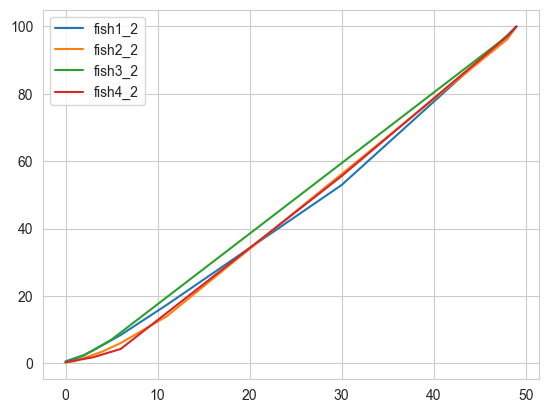

In [23]:
cum_sum_2.plot()

<AxesSubplot: >

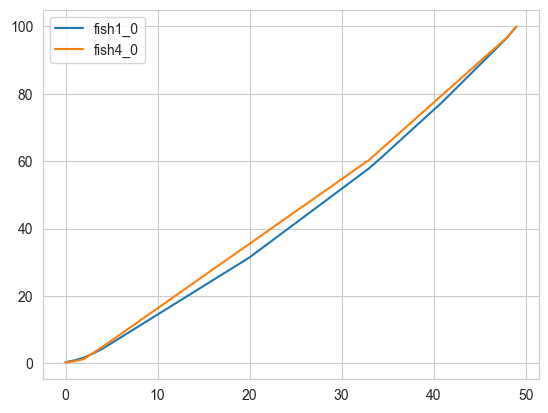

In [230]:
cum_sum_0.plot()

<AxesSubplot: >

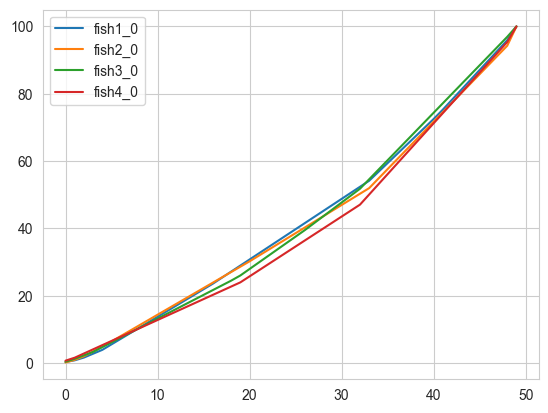

In [201]:
cum_sum_0.plot()

In [38]:
WMR_all_unfed = []
for key, u_wmr in WMR_unfed_fishSchool.items():
   for e in u_wmr:
       WMR_all_unfed.append(e)

In [40]:
WMR_all_fed = []
for key, f_wmr in WMR_fed_fishSchool.items():
    for e in f_wmr:
        WMR_all_fed.append(e)

Text(0.5, 1.0, 'unfed histogram')

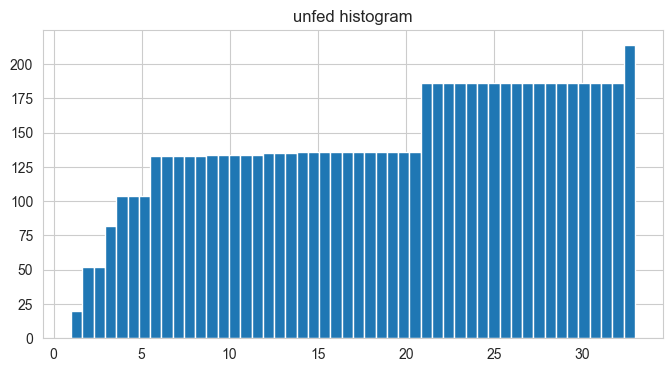

In [41]:
fig, ax = plt.subplots(figsize=(8, 4))
bins = np.arange(0,9,1)
n_bins = 50
# plot the cumulative histogram
u_counts, u_bins, u_patches = ax.hist(WMR_all_unfed, n_bins,
                                cumulative=True)
ax.set_title("unfed histogram")

Text(0.5, 1.0, 'fed histogram')

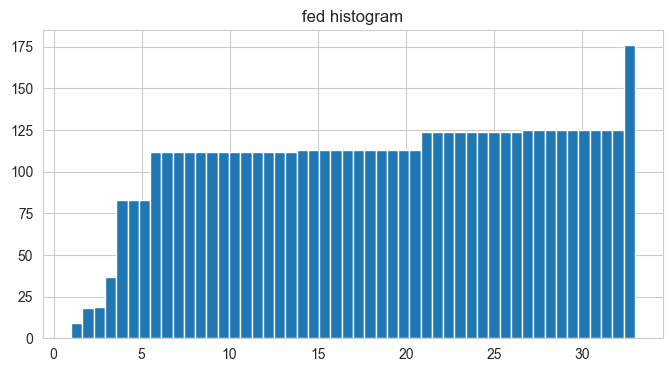

In [42]:
fig, ax = plt.subplots(figsize=(8, 4))
bins = np.arange(0,9,1)
n_bins = 50
# plot the cumulative histogram
f_counts, f_bins, f_patches = ax.hist(WMR_all_fed, n_bins,
                                cumulative=True)
ax.set_title("fed histogram")

Text(0.5, 0, 'circle size')

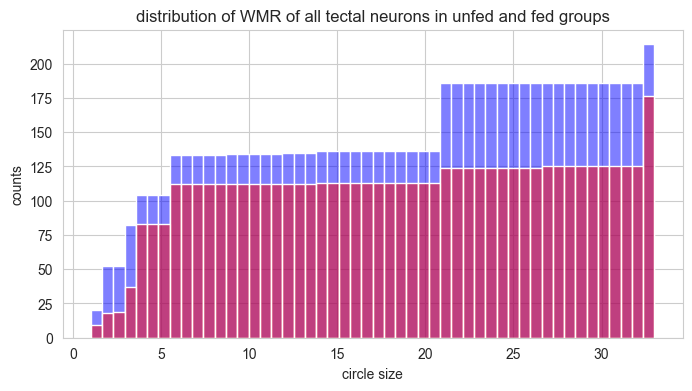

In [69]:
fig, ax = plt.subplots(figsize=(8, 4))
bins = np.arange(0,9,1)
n_bins = 50
# plot the cumulative histogram
u_counts, u_bins, u_patches = ax.hist(WMR_all_unfed, n_bins,
                                      cumulative=True, fill=True, fc=(0,0,1,0.5))
f_counts, f_bins, f_patches = ax.hist(WMR_all_fed, n_bins,
                                      cumulative=True, fill=True, fc=(1,0,0,0.5))
ax.set_title('distribution of WMR of all tectal neurons in unfed and fed groups')
ax.set_ylabel('counts')
ax.set_xlabel('circle size')

In [ ]:
unfed_cum_sum = ((u_counts.cumsum() / u_counts.sum())*100)
fed_cum_sum = ((f_counts.cumsum() / f_counts.sum()) * 100)

Text(0.5, 0, 'Size tuning (WMR angle(°))')

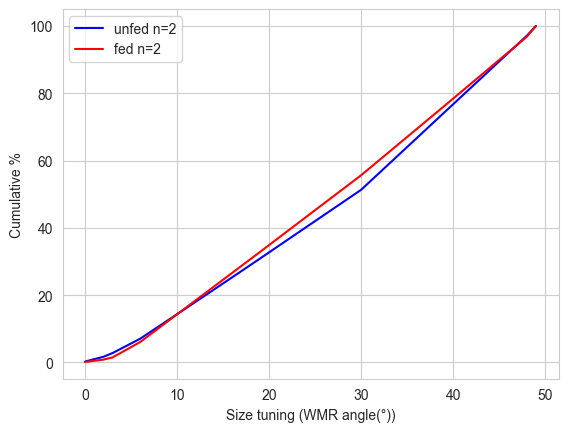

In [51]:
plt.plot(unfed_cum_sum, 'b')
plt.plot(fed_cum_sum, 'r')
plt.legend(['unfed n=2', 'fed n=2'])
plt.ylabel('Cumulative %')
plt.xlabel('Size tuning (WMR angle(°))')

Text(0.5, 0, 'Size tuning (WMR angle(°))')

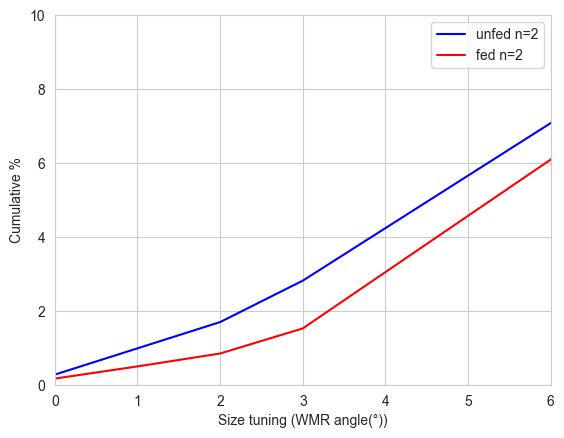

In [68]:
plt.plot(unfed_cum_sum, 'b')
plt.plot(fed_cum_sum, 'r')
plt.xlim(0,6)
plt.ylim(0,10)
plt.legend(['unfed n=2', 'fed n=2'])
plt.ylabel('Cumulative %')
plt.xlabel('Size tuning (WMR angle(°))')
